**The Signal Savior** <br>
Adnan Hasan, Danielle Raynor, Noah Roberson, Kevin Allen, Sahad Rafiuzzaman <br>
CYSE 635: AI Security and Privacy <br>



#### Importing necessary libraries

In [1]:
import os
import cv2
import random
import imghdr
import shutil
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
import matplotlib.pyplot as plt


from PIL import Image
from tensorflow import keras
from natsort import natsorted
from google.colab import files
import xml.etree.ElementTree as ET
from IPython.display import display
from matplotlib.image import imread
from sklearn.metrics import confusion_matrix
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Conv2D, MaxPool2D, Dense, Flatten, Dropout
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split

#### Download the datasets

In [2]:
!kaggle datasets download -d meowmeowmeowmeowmeow/gtsrb-german-traffic-sign

!echo
!mkdir /content/EURSD
!kaggle datasets download -d andrewmvd/road-sign-detection -p /content/EURSD


Dataset URL: https://www.kaggle.com/datasets/meowmeowmeowmeowmeow/gtsrb-german-traffic-sign
License(s): CC0-1.0
 97% 596M/612M [00:04<00:00, 133MB/s]
100% 612M/612M [00:04<00:00, 134MB/s]

Dataset URL: https://www.kaggle.com/datasets/andrewmvd/road-sign-detection
License(s): CC0-1.0
 99% 217M/218M [00:01<00:00, 179MB/s]
100% 218M/218M [00:01<00:00, 139MB/s]


#### File Checking

**Verify that zip files were downloaded**

In [3]:
!echo 'contents folder'
!ls -l /content/
!echo

!echo 'EURSD folder'
!ls -l /content/EURSD/
!echo

contents folder
total 626548
drwxr-xr-x 2 root root      4096 Dec  3 00:46 EURSD
-rw-r--r-- 1 root root 641568792 Oct 13  2019 gtsrb-german-traffic-sign.zip
drwxr-xr-x 1 root root      4096 Nov 25 19:13 sample_data

EURSD folder
total 223356
-rw-r--r-- 1 root root 228716498 May 24  2020 road-sign-detection.zip



#### Unzip the downloaded datasets

In [4]:
!unzip -o /content/gtsrb-german-traffic-sign.zip
!echo
!unzip -o /content/EURSD/road-sign-detection.zip -d /content/EURSD


Streaming output truncated to the last 5000 lines.
  inflating: train/7/00007_00035_00026.png  
  inflating: train/7/00007_00035_00027.png  
  inflating: train/7/00007_00035_00028.png  
  inflating: train/7/00007_00035_00029.png  
  inflating: train/7/00007_00036_00000.png  
  inflating: train/7/00007_00036_00001.png  
  inflating: train/7/00007_00036_00002.png  
  inflating: train/7/00007_00036_00003.png  
  inflating: train/7/00007_00036_00004.png  
  inflating: train/7/00007_00036_00005.png  
  inflating: train/7/00007_00036_00006.png  
  inflating: train/7/00007_00036_00007.png  
  inflating: train/7/00007_00036_00008.png  
  inflating: train/7/00007_00036_00009.png  
  inflating: train/7/00007_00036_00010.png  
  inflating: train/7/00007_00036_00011.png  
  inflating: train/7/00007_00036_00012.png  
  inflating: train/7/00007_00036_00013.png  
  inflating: train/7/00007_00036_00014.png  
  inflating: train/7/00007_00036_00015.png  
  inflating: train/7/00007_00036_00016.png  
  in

#### Verify the contents and file types

In [5]:
!ls -l /content/
!echo

!echo 'GTSRB Train'
!find /content/Train -type f | awk -F'.' '{print $NF}' | sort | uniq -c | awk '{print "File type: "$2", Count: "$1}'
!echo

!echo 'GTSRB Test'
!find /content/Test -type f | awk -F'.' '{print $NF}' | sort | uniq -c | awk '{print "File type: "$2", Count: "$1}'
!echo

!echo 'EURSD directory'
!ls -l /content/EURSD
!echo

!echo 'EURSD/images'
!find /content/EURSD/images -type f | awk -F'.' '{print $NF}' | sort | uniq -c | awk '{print "File type: "$2", Count: "$1}'
!echo

!echo 'EURSD/annotations'
!find /content/EURSD/annotations -type f | awk -F'.' '{print $NF}' | sort | uniq -c | awk '{print "File type: "$2", Count: "$1}'

total 629632
drwxr-xr-x  4 root root      4096 Dec  3 00:47 EURSD
-rw-r--r--  1 root root 641568792 Oct 13  2019 gtsrb-german-traffic-sign.zip
drwxr-xr-x  2 root root      4096 Dec  3 00:47 meta
drwxr-xr-x  2 root root      4096 Dec  3 00:46 Meta
-rw-r--r--  1 root root      1033 Oct 13  2019 Meta.csv
drwxr-xr-x  1 root root      4096 Nov 25 19:13 sample_data
drwxr-xr-x  2 root root    376832 Dec  3 00:47 test
drwxr-xr-x  2 root root    376832 Dec  3 00:46 Test
-rw-r--r--  1 root root    427897 Oct 13  2019 Test.csv
drwxr-xr-x 45 root root      4096 Dec  3 00:47 train
drwxr-xr-x 45 root root      4096 Dec  3 00:47 Train
-rw-r--r--  1 root root   1940896 Oct 13  2019 Train.csv

GTSRB Train
File type: png, Count: 39209

GTSRB Test
File type: csv, Count: 1
File type: png, Count: 12630

EURSD directory
total 223428
drwxr-xr-x 2 root root     32768 Dec  3 00:47 annotations
drwxr-xr-x 2 root root     36864 Dec  3 00:47 images
-rw-r--r-- 1 root root 228716498 May 24  2020 road-sign-detection.

#### Assigning Path for Datasets

In [6]:
GTSRB_path = '/content/'
GTSRB_train_path = '/content/Train'
GTSRB_test_path = '/content/Test'
EURSD_test_path = '/content/EURSD/images'
EURSD_annotations_path = '/content/EURSD/annotations'


#### Store data, labels in the list

In [7]:
data = []
labels = []
classes = 43

#### Preprocess the images

In [8]:
# Change IMG dimensions for final run. For final run, use 60x60
# Larger Image sizes use more ram and gpu
IMG_WIDTH = 60
IMG_HEIGHT = 60
channels = 3

for i in range(classes):
    path = os.path.join(GTSRB_train_path, str(i))
    images = os.listdir(path)
    for a in images:
        try:
            image = Image.open(path + '/'+ a)
            image = image.resize((IMG_WIDTH, IMG_HEIGHT))
            image = np.array(image)
            data.append(image)
            labels.append(i)
        except Exception as e:
            print(e)

#### Convert lists into numpy arrays

In [9]:
data = np.array(data)
labels = np.array(labels)

#### Load Data and Labels

In [10]:
print(data.shape, labels.shape)

(39209, 60, 60, 3) (39209,)


In [11]:
X_train, X_test, y_train, y_test = train_test_split(data, labels, test_size=0.2, random_state=0)

In [12]:
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(31367, 60, 60, 3) (7842, 60, 60, 3) (31367,) (7842,)


#### Convert labels to One Hot Encoding

In [13]:
y_train = to_categorical(y_train, 43)
y_test = to_categorical(y_test, 43)

#### Building the Model

In [14]:
model = Sequential()
model.add(keras.Input(shape=X_train.shape[1:]))
model.add(Conv2D(filters=32, kernel_size=(5,5), activation='relu'))
model.add(Conv2D(filters=32, kernel_size=(5,5), activation='relu'))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(rate=0.25))
model.add(Conv2D(filters=64, kernel_size=(3, 3), activation='relu'))
model.add(Conv2D(filters=64, kernel_size=(3, 3), activation='relu'))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(rate=0.25))
model.add(Flatten())
model.add(Dense(256, activation='relu'))
model.add(Dropout(rate=0.5))
model.add(Dense(43, activation='softmax'))

In [15]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 56, 56, 32)          │           2,432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 52, 52, 32)          │          25,632 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 26, 26, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 26, 26, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 24, 24, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 22, 22, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 11, 11, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 11, 11, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 7744)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 256)                 │       1,982,720 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 43)                  │          11,051 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,077,259 (7.92 MB)

 Trainable params: 2,077,259 (7.92 MB)

 Non-trainable params: 0 (0.00 B)

In [16]:
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [17]:
# Tried changing to local runtime (128 GB RAM/NVIDIA GeForce RTX 3060) but accuracy was singificantly impacted.
epochs = 30        # For testing use a smaller epoch. For final run, use 30.
batch_size = 32   # For testing use a larger batch_size (requires more ram). For final run, use 32.

history = model.fit(X_train, y_train, batch_size=batch_size, epochs=epochs, validation_data=(X_test, y_test))

Epoch 1/30
981/981 ━━━━━━━━━━━━━━━━━━━━ 24s 16ms/step - accuracy: 0.4565 - loss: 2.7447 - val_accuracy: 0.9422 - val_loss: 0.2234
Epoch 2/30
981/981 ━━━━━━━━━━━━━━━━━━━━ 9s 9ms/step - accuracy: 0.8675 - loss: 0.4687 - val_accuracy: 0.9680 - val_loss: 0.1471
Epoch 3/30
981/981 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - accuracy: 0.9118 - loss: 0.3148 - val_accuracy: 0.9783 - val_loss: 0.0931
Epoch 4/30
981/981 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - accuracy: 0.9285 - loss: 0.2479 - val_accuracy: 0.9809 - val_loss: 0.0732
Epoch 5/30
981/981 ━━━━━━━━━━━━━━━━━━━━ 10s 10ms/step - accuracy: 0.9374 - loss: 0.2164 - val_accuracy: 0.9819 - val_loss: 0.0680
Epoch 6/30
981/981 ━━━━━━━━━━━━━━━━━━━━ 9s 9ms/step - accuracy: 0.9391 - loss: 0.2056 - val_accuracy: 0.9837 - val_loss: 0.0675
Epoch 7/30
981/981 ━━━━━━━━━━━━━━━━━━━━ 11s 10ms/step - accuracy: 0.9460 - loss: 0.1822 - val_accuracy: 0.9894 - val_loss: 0.0470
Epoch 8/30
981/981 ━━━━━━━━━━━━━━━━━━━━ 9s 9ms/step - accuracy: 0.9516 - loss: 0.1673 - val_accu

#### Testing on Test Data

In [18]:
def testing(csv_file):
    y_test = pd.read_csv(csv_file)
    label = y_test["ClassId"].values
    imgs = y_test["Path"].values
    data=[]
    for img in imgs:
        image = Image.open(img)
        image = image.resize((IMG_WIDTH, IMG_HEIGHT))
        data.append(np.array(image))
    X_test=np.array(data)
    return X_test,label

In [19]:
X_test, label = testing('Test.csv')

In [20]:
pred = np.argmax(model.predict(X_test), axis=-1)
pred

395/395 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step


array([16,  1, 38, ...,  5,  7, 10])

In [21]:
print(accuracy_score(label, pred))

0.957957244655582


#### Loading the Classes

In [22]:
classes = {
    0: 'Speed limit (20km/h)',
    1: 'Speed limit (30km/h)',
    2: 'Speed limit (50km/h)',
    3: 'Speed limit (60km/h)',
    4: 'Speed limit (70km/h)',
    5: 'Speed limit (80km/h)',
    6: 'End of speed limit (80km/h)',
    7: 'Speed limit (100km/h)',
    8: 'Speed limit (120km/h)',
    9: 'No passing',
    10: 'No passing veh over 3.5 tons',
    11: 'Right-of-way at intersection',
    12: 'Priority road',
    13: 'Yield',
    14: 'Stop',
    15: 'No vehicles',
    16: 'Veh > 3.5 tons prohibited',
    17: 'No entry',
    18: 'General caution',
    19: 'Dangerous curve left',
    20: 'Dangerous curve right',
    21: 'Double curve',
    22: 'Bumpy road',
    23: 'Slippery road',
    24: 'Road narrows on the right',
    25: 'Road work',
    26: 'Traffic signals',
    27: 'Pedestrians',
    28: 'Children crossing',
    29: 'Bicycles crossing',
    30: 'Beware of ice/snow',
    31: 'Wild animals crossing',
    32: 'End speed + passing limits',
    33: 'Turn right ahead',
    34: 'Turn left ahead',
    35: 'Ahead only',
    36: 'Go straight or right',
    37: 'Go straight or left',
    38: 'Keep right',
    39: 'Keep left',
    40: 'Roundabout mandatory',
    41: 'End of no passing',
    42: 'End no passing veh > 3.5 tons'}

#### Run Predictions on an uploaded image

Saving 00006.png to 00006.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 633ms/step
Predicted traffic sign is: General caution


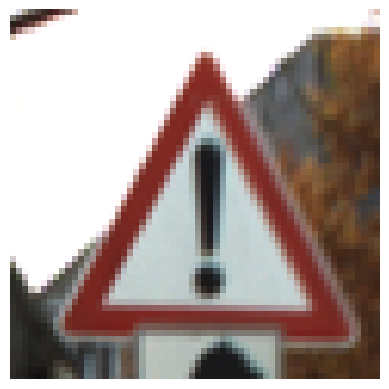

In [23]:
# Function to test on an uploaded image
def test_on_img_colab():
    # Upload an image file
    uploaded = files.upload()
    img_path = list(uploaded.keys())[0]  # Get the uploaded file name

    # Load and preprocess the image
    data = []
    image = Image.open(img_path).convert('RGB') # Convert the image to RGB format explicitly
    image = image.resize((IMG_WIDTH, IMG_HEIGHT))  # Resize to the model's required input size
    data.append(np.array(image))

    # Prepare the data for prediction
    X_test = np.array(data)

    # Check if the model expects 4 channels and add a dummy alpha channel if necessary
    if model.input_shape[-1] == 4 and X_test.shape[-1] == 3:
        X_test = np.dstack([X_test, np.ones(X_test.shape[:-1] + (1,)) * 255])


    Y_pred = model.predict(X_test)  # Use your model to predict the class
    predicted_class_index = np.argmax(Y_pred, axis=-1)[0] #Get the predicted class index
    return image, predicted_class_index #Return the image and predicted index


# Call the function and process the prediction
plot, prediction = test_on_img_colab()


# Print the prediction result (replace 'classes' with your mapping of class indices to labels)
print("Predicted traffic sign is:", classes[prediction]) #Use the predicted index directly

# Display the image
plt.imshow(plot)
plt.axis('off')  # Optional: remove axis for better display
plt.show()

# https://github.com/Spidy20/Traffic_Signs_WebApp/blob/master/traffic_signal_recognition.ipynb

#### Running on Prediction set

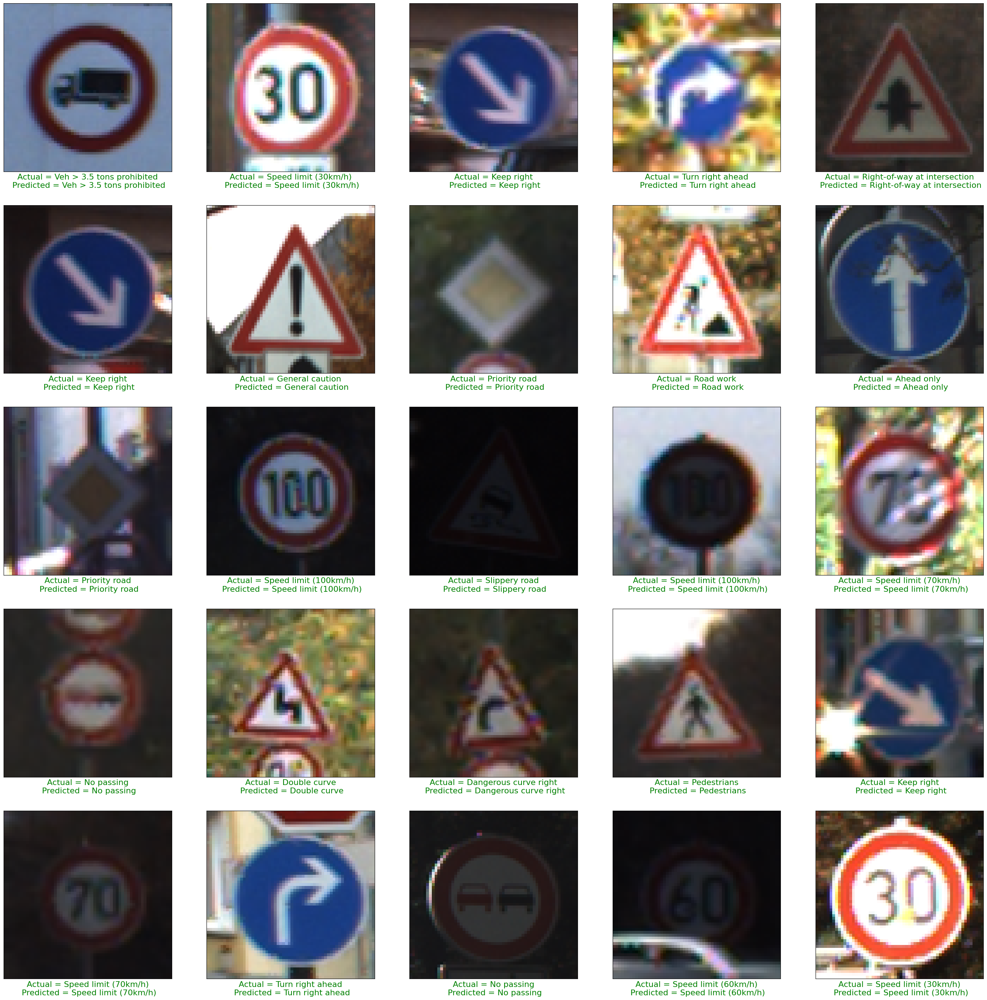

In [24]:
plt.figure(figsize = (35, 35))

start_index = 0
for i in range(25):
    plt.subplot(5, 5, i + 1)
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])
    prediction = pred[start_index + i]
    actual = label[start_index + i]
    col = 'g'
    if prediction != actual:
        col = 'r'

    # Get class names using your 'classes' dictionary
    predicted_class_name = classes.get(prediction, 'Unknown')
    actual_class_name = classes.get(actual, 'Unknown')

    plt.xlabel('Actual = {}\n Predicted = {}'.format(actual_class_name, predicted_class_name), color = col, fontsize=16)
    plt.imshow(X_test[start_index + i])
plt.show()

#### Evaluating the Model

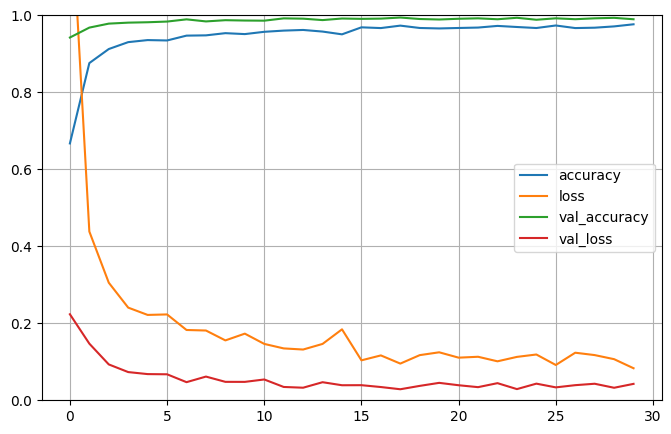

In [25]:
pd.DataFrame(history.history).plot(figsize=(8, 5))
plt.grid(True)
plt.gca().set_ylim(0, 1)
plt.show()

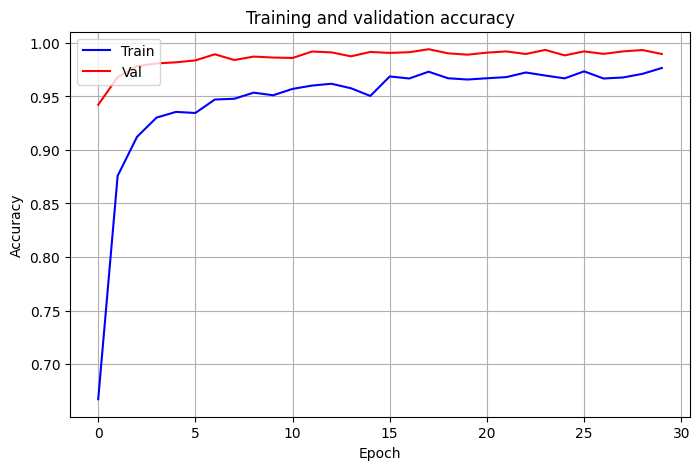

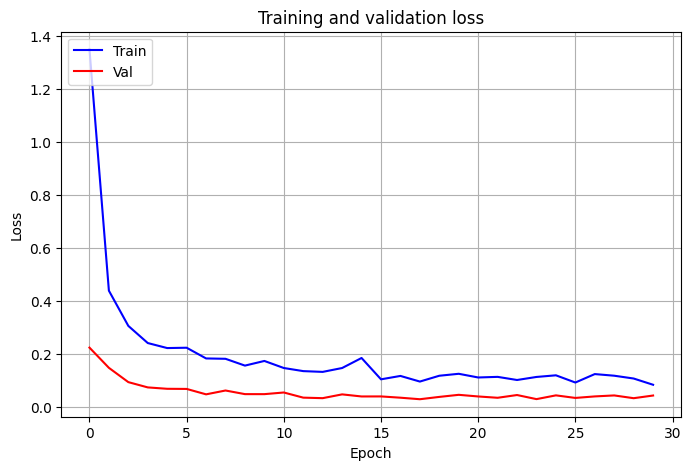

In [26]:
# Access metrics from history
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

# Plot training & validation accuracy values
plt.figure(figsize=(8, 5))
plt.plot(epochs, acc, 'b', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')  # Add legend
plt.grid(True)
plt.show()

# Plot training & validation loss values
plt.figure(figsize=(8, 5))
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')  # Add legend
plt.grid(True)
plt.show()

#### Confusion Matrix

In [27]:
cf = confusion_matrix(label, pred)

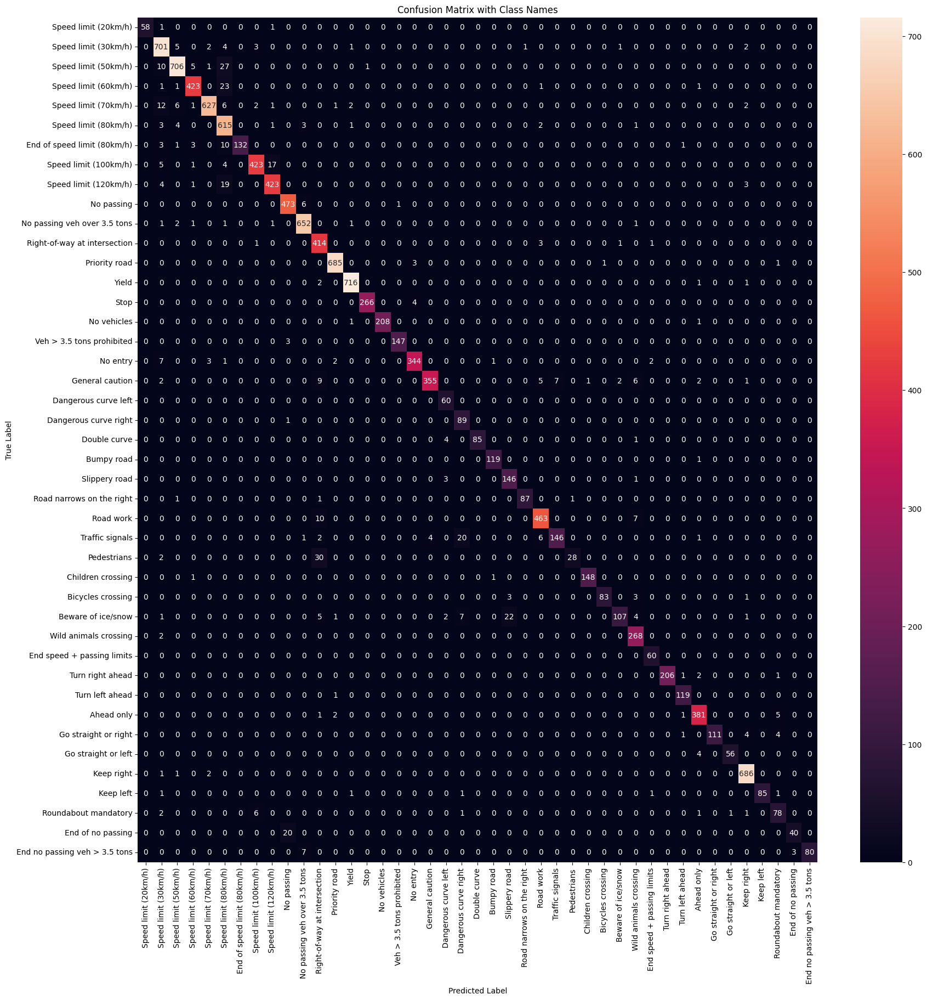

In [28]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Assuming 'cf' is your confusion matrix and 'classes' is your dictionary mapping class indices to names

# Get a list of class names in the correct order
class_names_list = [classes.get(i, 'Unknown') for i in range(len(classes))]  # handles unknown class indices

df_cm = pd.DataFrame(cf, index=class_names_list, columns=class_names_list)  # Update DataFrame with class names
plt.figure(figsize=(20, 20))
sns.heatmap(df_cm, annot=True, fmt="d")  # fmt="d" to display integer counts
plt.title("Confusion Matrix with Class Names")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

#### Classification Report

In [29]:
from sklearn.metrics import classification_report

print(classification_report(label, pred))

              precision    recall  f1-score   support

           0       1.00      0.97      0.98        60
           1       0.92      0.97      0.95       720
           2       0.97      0.94      0.96       750
           3       0.97      0.94      0.95       450
           4       0.99      0.95      0.97       660
           5       0.87      0.98      0.92       630
           6       1.00      0.88      0.94       150
           7       0.97      0.94      0.96       450
           8       0.95      0.94      0.95       450
           9       0.95      0.99      0.97       480
          10       0.97      0.99      0.98       660
          11       0.87      0.99      0.93       420
          12       0.99      0.99      0.99       690
          13       0.99      0.99      0.99       720
          14       1.00      0.99      0.99       270
          15       1.00      0.99      1.00       210
          16       0.99      0.98      0.99       150
          17       0.98    

#### Image Count for Training Dataset

In [30]:
# Show the training image counts per class
train_path = GTSRB_train_path
class_names = os.listdir(train_path)  # Get a list of class names (folder names)

class_data = []  # List to store class numbers, image counts, and class names

for class_name in class_names:
    class_number = int(class_name)  # Convert class name to integer (class number)
    class_path = os.path.join(train_path, class_name)  # Path to the class folder
    image_count = len(os.listdir(class_path))  # Count the number of images in the folder
    class_name_from_dict = classes.get(class_number, 'Unknown')  # Get class name from dictionary or 'Unknown' if not found
    class_data.append((class_number, image_count, class_name_from_dict))  # Add a tuple to the list

# Sort the list by class number (first element of the tuple)
sorted_class_data = sorted(class_data)

# Print the results in numerical order, including class names
print(f"Total Training Images:\n")
for class_number, image_count, class_name in sorted_class_data:
    print(f"Class Number: {class_number:2d},  Image Count: {image_count:5d}, Class Name: {class_name:40s}")

Total Training Images:

Class Number:  0,  Image Count:   210, Class Name: Speed limit (20km/h)                    
Class Number:  1,  Image Count:  2220, Class Name: Speed limit (30km/h)                    
Class Number:  2,  Image Count:  2250, Class Name: Speed limit (50km/h)                    
Class Number:  3,  Image Count:  1410, Class Name: Speed limit (60km/h)                    
Class Number:  4,  Image Count:  1980, Class Name: Speed limit (70km/h)                    
Class Number:  5,  Image Count:  1860, Class Name: Speed limit (80km/h)                    
Class Number:  6,  Image Count:   420, Class Name: End of speed limit (80km/h)             
Class Number:  7,  Image Count:  1440, Class Name: Speed limit (100km/h)                   
Class Number:  8,  Image Count:  1410, Class Name: Speed limit (120km/h)                   
Class Number:  9,  Image Count:  1470, Class Name: No passing                              
Class Number: 10,  Image Count:  2010, Class Name: No pa

#### VIsualizing the Training Dataset

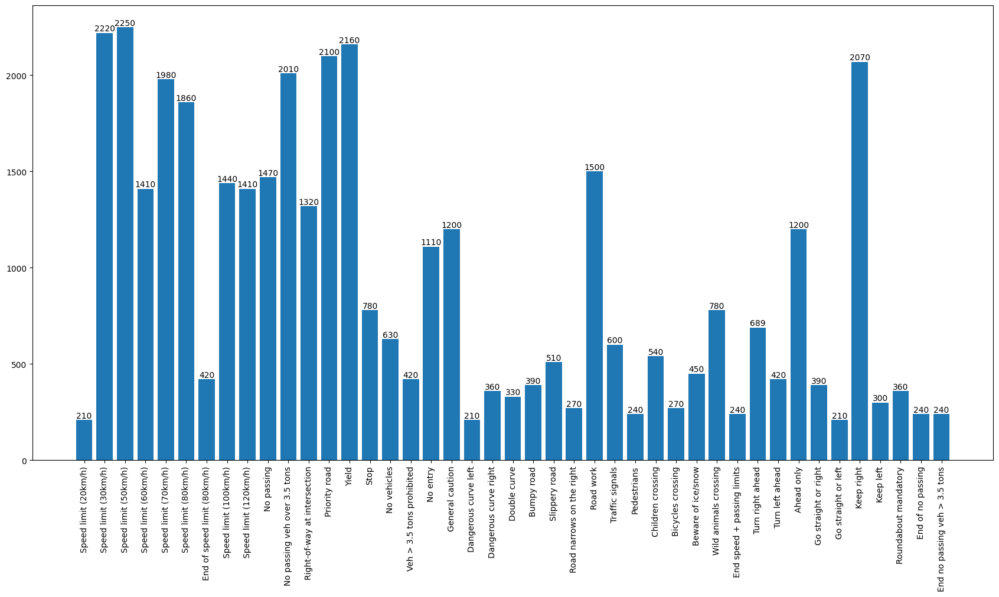

In [31]:
folders = os.listdir(train_path)

train_number = []
class_num = []

for folder in folders:
    train_files = os.listdir(train_path + '/' + folder)
    train_number.append(len(train_files))
    class_num.append(classes[int(folder)])

# Create a DataFrame to store class numbers and image counts
df = pd.DataFrame({'Class Number': [int(folder) for folder in folders],
                   'Image Count': train_number,
                   'Class Name': class_num})

# Sort the DataFrame by 'Class Number'
df = df.sort_values(by=['Class Number'])

# Plotting the number of images in each class
plt.figure(figsize=(21, 10))
bars = plt.bar(df['Class Name'], df['Image Count'])  # Use sorted data for plotting
plt.xticks(df['Class Name'], rotation='vertical')

# Add text annotations for image counts on top of bars
for bar, count in zip(bars, df['Image Count']):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(),
             str(count), ha='center', va='bottom')

plt.show()

#### Visualizing 50 Random Images from the Training Data

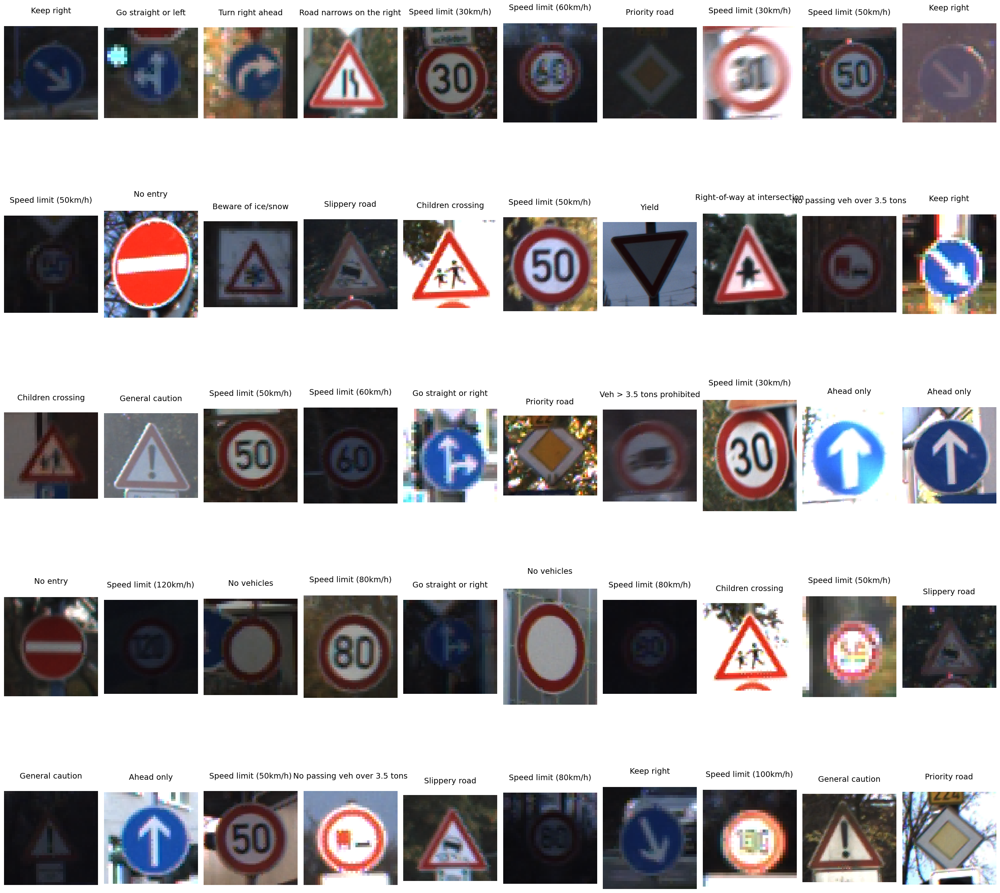

In [32]:
# Visualizing 50 random images from train data
train_path = GTSRB_train_path

# Function to get all image paths from a directory and its subdirectories, automatically detecting image types
def get_image_paths(directory):
    image_paths = []
    for root, _, files in os.walk(directory):
        for file in files:
            file_path = os.path.join(root, file)
            # Check if the file is an image using imghdr
            if imghdr.what(file_path) is not None:
                image_paths.append(file_path)
    return image_paths

# Get a list of all image paths in the training data directory
image_paths = get_image_paths(train_path)

# Choose 50 random image paths
random_image_paths = random.sample(image_paths, 50)

# Create a figure and subplots to display the images
plt.figure(figsize=(25, 25))

for i, image_path in enumerate(random_image_paths):
    # Read the image using imread
    image = imread(image_path)

    # Get class number from the directory name
    class_number = int(os.path.basename(os.path.dirname(image_path)))

    # Get class name using the classes dictionary
    class_name = classes.get(class_number, 'Unknown')  # Handle unknown class numbers

    # Create a subplot and display the image
    plt.subplot(5, 10, i + 1)  # 5 rows, 10 columns for 50 images
    plt.axis('off')
    plt.imshow(image)
    plt.title(class_name, y=1.10, fontsize=14)  # Display class name as title
plt.tight_layout()
plt.show()

#### Visualizing 50 Random Images from the Testing Data

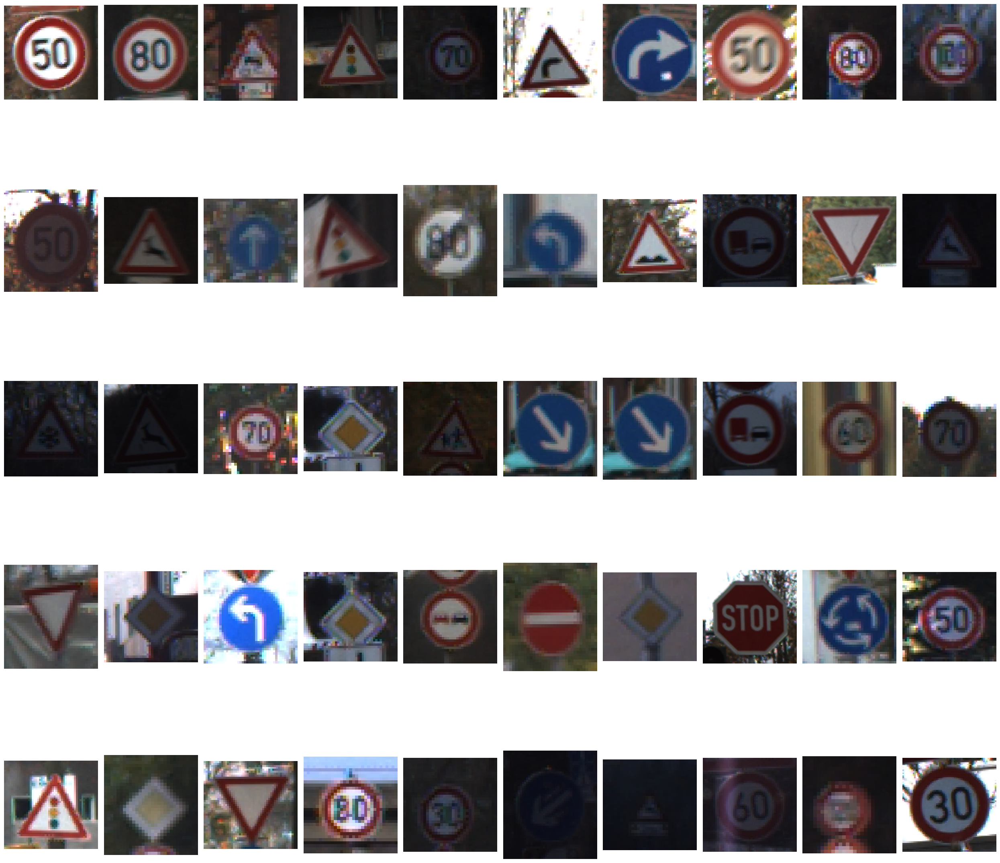

In [33]:
# Visualizing 50 random images from test data
test_path = GTSRB_test_path

# Function to get all image paths from a directory and its subdirectories, automatically detecting image types
def get_image_paths(directory):
    image_paths = []
    for root, _, files in os.walk(directory):
        for file in files:
            file_path = os.path.join(root, file)
            # Check if the file is an image using imghdr
            if imghdr.what(file_path) is not None:
                image_paths.append(file_path)
    return image_paths

# Get a list of all image paths in the training data directory
image_paths = get_image_paths(test_path)

# Choose 50 random image paths
random_image_paths = random.sample(image_paths, 50)

# Create a figure and subplots to display the images
plt.figure(figsize=(25, 25))

for i, image_path in enumerate(random_image_paths):
    # Read the image using imread
    image = imread(image_path)

    # Create a subplot and display the image
    plt.subplot(5, 10, i + 1)  # 5 rows, 10 columns for 50 images
    plt.axis('off')
    plt.imshow(image)
plt.tight_layout()
plt.show()

### EURSD Testing <br>
----

#### Visualizing 50 Random Images from the EURSD Testing Data

1. Using the XML file to identify the images



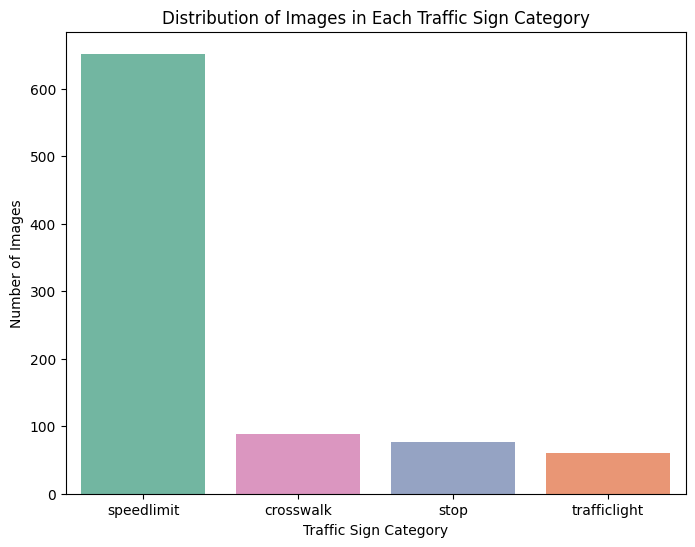

,count
class,
speedlimit,652
crosswalk,88
stop,76
trafficlight,61


In [34]:
# Function to list all files of a specific type in a directory
def filelist(root, file_type):
    return [os.path.join(directory_path, f) for directory_path, directory_name,
            files in os.walk(root) for f in files if f.endswith(file_type)]

# Function to generate a DataFrame of annotations, filtering for the four specified categories
def generate_train_df(annotations_path, images_path):  # Add images_path as an argument
    annotations = filelist(annotations_path, '.xml')
    anno_list = []

    for annotation_file in annotations:
        root = ET.parse(annotation_file).getroot()
        anno = {}

        # Construct file path using os.path.join
        anno['filename'] = os.path.join(images_path, root.find("./filename").text)
        anno['class'] = root.find("./object/name").text

        if anno['class'] in ["trafficlight", 'stop', "speedlimit", "crosswalk"]:
            anno_list.append(anno)

    return pd.DataFrame(anno_list)

# Generate DataFrame of annotations and filter by class
df_train = generate_train_df(EURSD_annotations_path, EURSD_test_path)

# Display a count of images in each category
plt.figure(figsize=(8, 6))
sns.countplot(data=df_train, x='class', hue='class', order=df_train['class'].value_counts().index, palette='Set2', legend=False)
plt.title("Distribution of Images in Each Traffic Sign Category")
plt.xlabel("Traffic Sign Category")
plt.ylabel("Number of Images")
plt.show()
df_train['class'].value_counts()

2. Spliting EURSD images into respective class folders

In [35]:
# Create directories based on classes and move images to respective folders
EURSD_test_path = '/content/EURSD/images'
for index, row in df_train.iterrows():
    class_name = row['class']
    filename = row['filename']

    # Define the directory path for the class using os.path.join
    class_dir = os.path.join(EURSD_test_path, class_name)

    # Create the class folder if it doesn't exist
    os.makedirs(class_dir, exist_ok=True)

    # Move the image file into the appropriate class folder
    if os.path.exists(filename):  # Check if the file exists using os.path.exists
        shutil.move(filename, os.path.join(class_dir, os.path.basename(filename)))

3. Display the randomized EURSD images

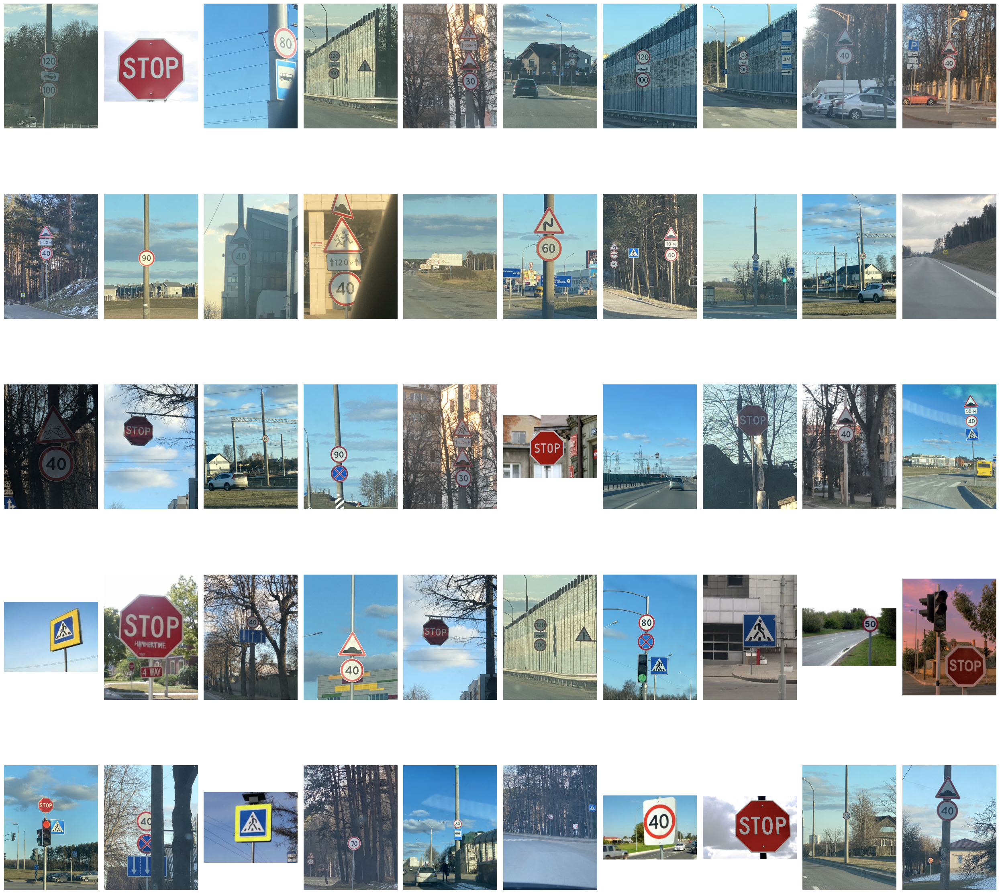

In [36]:
# Visualizing 50 random images from EURSD test data
# EURSD_test_path = '/content/datasets/EURSD/images'

# Function to get all image paths from a directory and its subdirectories, automatically detecting image types
def get_image_paths(directory):
    image_paths = []
    for root, _, files in os.walk(directory):
        for file in files:
            file_path = os.path.join(root, file)
            # Check if the file is an image using imghdr
            if imghdr.what(file_path) is not None:
                image_paths.append(file_path)
    return image_paths

# Get a list of all image paths in the training data directory
image_paths = get_image_paths(EURSD_test_path)

# Choose 50 random image paths
random_image_paths = random.sample(image_paths, 50)

# Create a figure and subplots to display the images
plt.figure(figsize=(25, 25))

for i, image_path in enumerate(random_image_paths):
    # Read the image using imread
    image = imread(image_path)

    # Create a subplot and display the image
    plt.subplot(5, 10, i + 1)  # 5 rows, 10 columns for 50 images
    plt.axis('off')
    plt.imshow(image)
plt.tight_layout()
plt.show()

#### Verifying the Classes

In [37]:
print(classes)

{0: 'Speed limit (20km/h)', 1: 'Speed limit (30km/h)', 2: 'Speed limit (50km/h)', 3: 'Speed limit (60km/h)', 4: 'Speed limit (70km/h)', 5: 'Speed limit (80km/h)', 6: 'End of speed limit (80km/h)', 7: 'Speed limit (100km/h)', 8: 'Speed limit (120km/h)', 9: 'No passing', 10: 'No passing veh over 3.5 tons', 11: 'Right-of-way at intersection', 12: 'Priority road', 13: 'Yield', 14: 'Stop', 15: 'No vehicles', 16: 'Veh > 3.5 tons prohibited', 17: 'No entry', 18: 'General caution', 19: 'Dangerous curve left', 20: 'Dangerous curve right', 21: 'Double curve', 22: 'Bumpy road', 23: 'Slippery road', 24: 'Road narrows on the right', 25: 'Road work', 26: 'Traffic signals', 27: 'Pedestrians', 28: 'Children crossing', 29: 'Bicycles crossing', 30: 'Beware of ice/snow', 31: 'Wild animals crossing', 32: 'End speed + passing limits', 33: 'Turn right ahead', 34: 'Turn left ahead', 35: 'Ahead only', 36: 'Go straight or right', 37: 'Go straight or left', 38: 'Keep right', 39: 'Keep left', 40: 'Roundabout man

#### CROSSWALK (CW) <br>
EURSD CW is blue and very differrent than GTSRB. GTSRB has three different classes on crossing, and the signs looks very different. EURSD is blue while GTSRB is red. <br>
GTSRB: pedestrian crossing, children crossing, and bicycle crossing. <br>
This is just to observe how the model reacts to different signs.

In [38]:
import os
import cv2
import imghdr
import numpy as np
import pandas as pd
from PIL import Image
from sklearn.metrics import accuracy_score
from tensorflow import keras
from IPython.display import display
from natsort import natsorted

# Path to the 'crosswalk' subdirectory
test_data_dir = os.path.join(EURSD_test_path, 'crosswalk')

data = []
image_filenames = []

# Iterate through images within the 'crosswalk' subdirectory
for filename in os.listdir(test_data_dir):
    image_path = os.path.join(test_data_dir, filename)

    if imghdr.what(image_path) is not None:
        image = cv2.imread(image_path)

        if image is not None:
            image_fromarray = Image.fromarray(image, 'RGB')
            resize_image = image_fromarray.resize((IMG_HEIGHT, IMG_WIDTH))
            data.append(np.array(resize_image))
            image_filenames.append(filename)
        else:
            print(f"Error loading image: {image_path}")

# Preprocess and predict for the 'crosswalk' subdirectory
X_test = np.array(data)

pred = np.argmax(model.predict(X_test), axis=-1)

# Create a pandas DataFrame for the predictions
predictions_df = pd.DataFrame({'Filename': image_filenames, 'Predicted Class': pred})
predictions_df['Predicted Class Name'] = predictions_df['Predicted Class'].map(classes)
predictions_df['Filename'] = natsorted(predictions_df['Filename'])
predictions_df = predictions_df.sort_values(by=['Filename'])

# Display the DataFrame as a table
display(predictions_df)

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 452ms/step


,Filename,Predicted Class,Predicted Class Name
0,road122.png,18,General caution
1,road123.png,1,Speed limit (30km/h)
2,road124.png,18,General caution
3,road125.png,40,Roundabout mandatory
4,road126.png,14,Stop
...,...,...,...
83,road658.png,17,No entry
84,road669.png,25,Road work
85,road782.png,25,Road work
86,road826.png,18,General caution


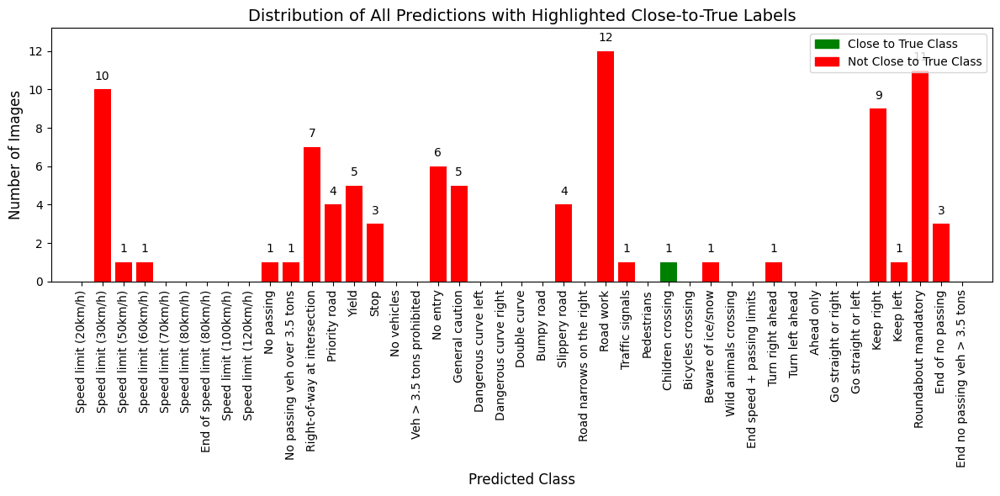

In [39]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches  # For custom legend handles

# Count all predictions
all_predictions_counts = predictions_df['Predicted Class'].value_counts()

# Identify the close-to-true labels
close_to_true_labels = [27, 28, 29]

# Prepare colors: green for "close to true labels", red for others
bar_colors = ['green' if cls in close_to_true_labels else 'red' for cls in all_predictions_counts.index]

# Get all possible class indices
all_classes = np.arange(len(classes))

# Plot a bar graph for all predictions
plt.figure(figsize=(12, 6))
bars = plt.bar(all_predictions_counts.index, all_predictions_counts.values, color=bar_colors)

# Adjust the y-axis limit to prevent overlap
y_max = max(all_predictions_counts.values)  # Find the maximum value in the dataset
plt.ylim(0, y_max + (0.1 * y_max))  # Add 10% buffer space above the tallest bar

# Add numbers on top of each bar
for bar in bars:
    height = bar.get_height()
    if height > 0:  # Only label bars with non-zero height
        plt.text(
            bar.get_x() + bar.get_width() / 2,  # X position (center of the bar)
            height + 0.5,                      # Y position (just above the bar)
            f'{int(height)}',                  # Text label (convert to integer)
            ha='center',                       # Horizontal alignment
            fontsize=10                         # Font size for the label
        )

# Customize the plot
plt.title("Distribution of All Predictions with Highlighted Close-to-True Labels", fontsize=14)
plt.xlabel("Predicted Class", fontsize=12)
plt.ylabel("Number of Images", fontsize=12)

# Set x-axis ticks to include all classes
plt.xticks(ticks=all_classes, labels=[classes.get(c, 'Unknown') for c in all_classes], rotation=90)

# Create custom legend
close_to_true_patch = mpatches.Patch(color='green', label='Close to True Class')
not_close_patch = mpatches.Patch(color='red', label='Not Close to True Class')
plt.legend(handles=[close_to_true_patch, not_close_patch], loc='upper right')

plt.tight_layout()
plt.show()


In [40]:
# Count all predictions
all_predictions_counts = predictions_df['Predicted Class'].value_counts()

# Identify the close-to-true labels
close_to_true_labels = [27, 28]

# Count the total for each category
close_to_true_count = all_predictions_counts[all_predictions_counts.index.isin(close_to_true_labels)].sum()
not_close_to_true_count = all_predictions_counts[~all_predictions_counts.index.isin(close_to_true_labels)].sum()

# Print the results
print(f"Total number of images classified as 'Close to True Class': {close_to_true_count}")
print(f"Total number of images classified as 'Not Close to True Class': {not_close_to_true_count}")


Total number of images classified as 'Close to True Class': 1
Total number of images classified as 'Not Close to True Class': 87


#### Stop Signs

In [41]:
# Path to the 'Stop' subdirectory
test_data_dir = os.path.join(EURSD_test_path, 'stop')

data = []
image_filenames = []

# Iterate through images within the 'stop' subdirectory
for filename in os.listdir(test_data_dir):
    image_path = os.path.join(test_data_dir, filename)

    if imghdr.what(image_path) is not None:
        image = cv2.imread(image_path)

        if image is not None:
            image_fromarray = Image.fromarray(image, 'RGB')
            resize_image = image_fromarray.resize((IMG_HEIGHT, IMG_WIDTH))
            data.append(np.array(resize_image))
            image_filenames.append(filename)
        else:
            print(f"Error loading image: {image_path}")

# Preprocess and predict for the 'stop' subdirectory
X_test = np.array(data)

pred = np.argmax(model.predict(X_test), axis=-1)

# Create a pandas DataFrame for the predictions
predictions_df = pd.DataFrame({'Filename': image_filenames, 'Predicted Class': pred})
predictions_df['Predicted Class Name'] = predictions_df['Predicted Class'].map(classes)
predictions_df['Filename'] = natsorted(predictions_df['Filename'])
predictions_df = predictions_df.sort_values(by=['Filename'])

# Display the DataFrame as a table
display(predictions_df)

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 419ms/step


,Filename,Predicted Class,Predicted Class Name
48,road185.png,13,Yield
49,road270.png,35,Ahead only
50,road272.png,38,Keep right
51,road278.png,13,Yield
52,road289.png,1,Speed limit (30km/h)
...,...,...,...
43,road95.png,41,End of no passing
44,road96.png,13,Yield
45,road97.png,40,Roundabout mandatory
46,road98.png,38,Keep right


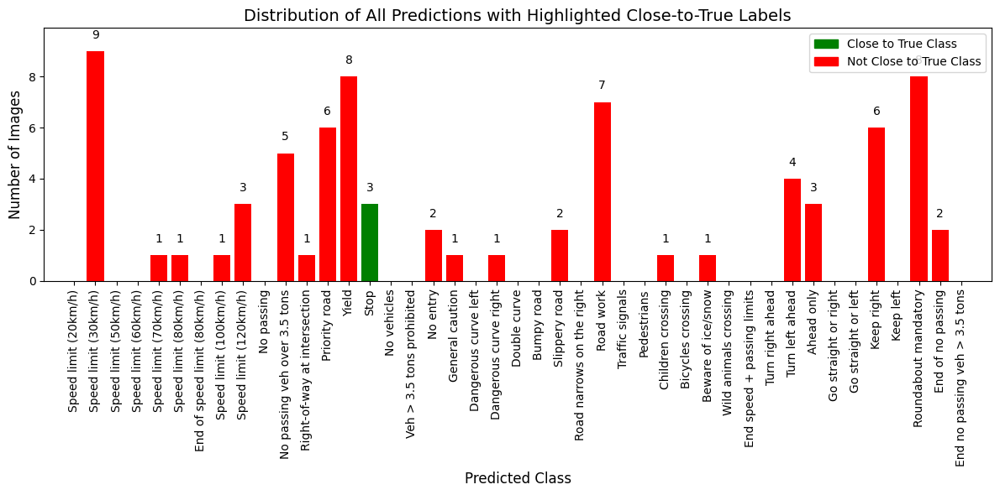

In [42]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches  # For custom legend handles

# Count all predictions
all_predictions_counts = predictions_df['Predicted Class'].value_counts()

# Identify the close-to-true labels
close_to_true_stop_labels = [14]

# Prepare colors: green for "close to true labels", red for others
bar_colors = ['green' if cls in close_to_true_stop_labels else 'red' for cls in all_predictions_counts.index]

# Get all possible class indices
all_classes = np.arange(len(classes))

# Plot a bar graph for all predictions
plt.figure(figsize=(12, 6))
bars = plt.bar(all_predictions_counts.index, all_predictions_counts.values, color=bar_colors)

# Adjust the y-axis limit to prevent overlap
y_max = max(all_predictions_counts.values)  # Find the maximum value in the dataset
plt.ylim(0, y_max + (0.1 * y_max))  # Add 10% buffer space above the tallest bar

# Add numbers on top of each bar
for bar in bars:
    height = bar.get_height()
    if height > 0:  # Only label bars with non-zero height
        plt.text(
            bar.get_x() + bar.get_width() / 2,  # X position (center of the bar)
            height + 0.5,                      # Y position (just above the bar)
            f'{int(height)}',                  # Text label (convert to integer)
            ha='center',                       # Horizontal alignment
            fontsize=10                         # Font size for the label
        )

# Customize the plot
plt.title("Distribution of All Predictions with Highlighted Close-to-True Labels", fontsize=14)
plt.xlabel("Predicted Class", fontsize=12)
plt.ylabel("Number of Images", fontsize=12)

# Set x-axis ticks to include all classes
plt.xticks(ticks=all_classes, labels=[classes.get(c, 'Unknown') for c in all_classes], rotation=90)

# Create custom legend
close_to_true_patch = mpatches.Patch(color='green', label='Close to True Class')
not_close_patch = mpatches.Patch(color='red', label='Not Close to True Class')
plt.legend(handles=[close_to_true_patch, not_close_patch], loc='upper right')

plt.tight_layout()
plt.show()

In [43]:
# Count all predictions
all_predictions_counts = predictions_df['Predicted Class'].value_counts()

# Identify the close-to-true labels
close_to_true_labels = [14]

# Count the total for each category
close_to_true_count = all_predictions_counts[all_predictions_counts.index.isin(close_to_true_labels)].sum()
not_close_to_true_count = all_predictions_counts[~all_predictions_counts.index.isin(close_to_true_labels)].sum()

# Print the results
print(f"Total number of images classified as 'Close to True Class': {close_to_true_count}")
print(f"Total number of images classified as 'Not Close to True Class': {not_close_to_true_count}")

Total number of images classified as 'Close to True Class': 3
Total number of images classified as 'Not Close to True Class': 73


#### Actual Traffic Lights (not signs)

In [44]:
import os
import cv2
import imghdr
import numpy as np
import pandas as pd
from PIL import Image
from sklearn.metrics import accuracy_score
from tensorflow import keras
from IPython.display import display
from natsort import natsorted

# Path to the 'trafficlight' subdirectory
test_data_dir = os.path.join(EURSD_test_path, 'trafficlight')

data = []
image_filenames = []

# Iterate through images within the 'trafficlight' subdirectory
for filename in os.listdir(test_data_dir):
    image_path = os.path.join(test_data_dir, filename)

    if imghdr.what(image_path) is not None:
        image = cv2.imread(image_path)

        if image is not None:
            image_fromarray = Image.fromarray(image, 'RGB')
            resize_image = image_fromarray.resize((IMG_HEIGHT, IMG_WIDTH))
            data.append(np.array(resize_image))
            image_filenames.append(filename)
        else:
            print(f"Error loading image: {image_path}")

# Preprocess and predict for the 'trafficlight' subdirectory
X_test = np.array(data)

pred = np.argmax(model.predict(X_test), axis=-1)

# Create a pandas DataFrame for the predictions
predictions_df = pd.DataFrame({'Filename': image_filenames, 'Predicted Class': pred})
predictions_df['Predicted Class Name'] = predictions_df['Predicted Class'].map(classes)
predictions_df['Filename'] = natsorted(predictions_df['Filename'])
predictions_df = predictions_df.sort_values(by=['Filename'])

# Display the DataFrame as a table
display(predictions_df)

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 704ms/step


,Filename,Predicted Class,Predicted Class Name
0,road0.png,11,Right-of-way at intersection
1,road1.png,40,Roundabout mandatory
10,road10.png,38,Keep right
11,road11.png,1,Speed limit (30km/h)
12,road12.png,35,Ahead only
...,...,...,...
57,road820.png,25,Road work
58,road822.png,25,Road work
59,road825.png,33,Turn right ahead
60,road846.png,10,No passing veh over 3.5 tons


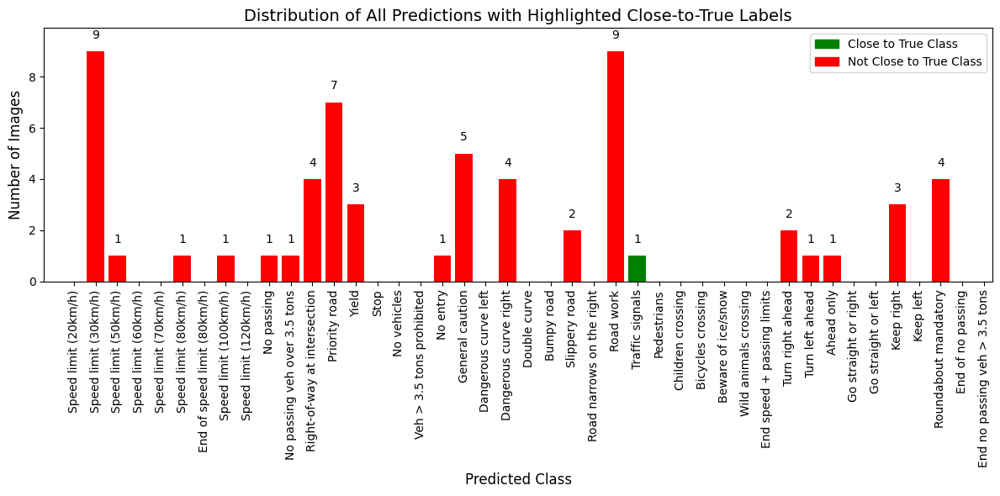

In [45]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches  # For custom legend handles

# Count all predictions
all_predictions_counts = predictions_df['Predicted Class'].value_counts()

# Identify the close-to-true labels
close_to_true_TL_labels = [26]

# Prepare colors: green for "close to true labels", red for others
bar_colors = ['green' if cls in close_to_true_TL_labels else 'red' for cls in all_predictions_counts.index]

# Get all possible class indices
all_classes = np.arange(len(classes))

# Plot a bar graph for all predictions
plt.figure(figsize=(12, 6))
bars = plt.bar(all_predictions_counts.index, all_predictions_counts.values, color=bar_colors)

# Adjust the y-axis limit to prevent overlap
y_max = max(all_predictions_counts.values)  # Find the maximum value in the dataset
plt.ylim(0, y_max + (0.1 * y_max))  # Add 10% buffer space above the tallest bar

# Add numbers on top of each bar
for bar in bars:
    height = bar.get_height()
    if height > 0:  # Only label bars with non-zero height
        plt.text(
            bar.get_x() + bar.get_width() / 2,  # X position (center of the bar)
            height + 0.5,                      # Y position (just above the bar)
            f'{int(height)}',                  # Text label (convert to integer)
            ha='center',                       # Horizontal alignment
            fontsize=10                         # Font size for the label
        )

# Customize the plot
plt.title("Distribution of All Predictions with Highlighted Close-to-True Labels", fontsize=14)
plt.xlabel("Predicted Class", fontsize=12)
plt.ylabel("Number of Images", fontsize=12)

# Set x-axis ticks to include all classes
plt.xticks(ticks=all_classes, labels=[classes.get(c, 'Unknown') for c in all_classes], rotation=90)

# Create custom legend
close_to_true_patch = mpatches.Patch(color='green', label='Close to True Class')
not_close_patch = mpatches.Patch(color='red', label='Not Close to True Class')
plt.legend(handles=[close_to_true_patch, not_close_patch], loc='upper right')

plt.tight_layout()
plt.show()

In [46]:
# Count all predictions
all_predictions_counts = predictions_df['Predicted Class'].value_counts()

# Identify the close-to-true labels
close_to_true_labels = [26]

# Count the total for each category
close_to_true_count = all_predictions_counts[all_predictions_counts.index.isin(close_to_true_labels)].sum()
not_close_to_true_count = all_predictions_counts[~all_predictions_counts.index.isin(close_to_true_labels)].sum()

# Print the results
print(f"Total number of images classified as 'Close to True Class': {close_to_true_count}")
print(f"Total number of images classified as 'Not Close to True Class': {not_close_to_true_count}")

Total number of images classified as 'Close to True Class': 1
Total number of images classified as 'Not Close to True Class': 60


#### Speed Limit Signs

In [47]:
import os
import cv2
import imghdr
import numpy as np
import pandas as pd
from PIL import Image
from sklearn.metrics import accuracy_score
from tensorflow import keras
from IPython.display import display
from natsort import natsorted

# Path to the 'speedlimit' subdirectory
test_data_dir = os.path.join(EURSD_test_path, 'speedlimit')

data = []
image_filenames = []

# Iterate through images within the 'speedlimit' subdirectory
for filename in os.listdir(test_data_dir):
    image_path = os.path.join(test_data_dir, filename)

    if imghdr.what(image_path) is not None:
        image = cv2.imread(image_path)

        if image is not None:
            image_fromarray = Image.fromarray(image, 'RGB')
            resize_image = image_fromarray.resize((IMG_HEIGHT, IMG_WIDTH))
            data.append(np.array(resize_image))
            image_filenames.append(filename)
        else:
            print(f"Error loading image: {image_path}")

# Preprocess and predict for the 'speedlimit' subdirectory
X_test = np.array(data)

pred = np.argmax(model.predict(X_test), axis=-1)

# Create a pandas DataFrame for the predictions
predictions_df = pd.DataFrame({'Filename': image_filenames, 'Predicted Class': pred})
predictions_df['Predicted Class Name'] = predictions_df['Predicted Class'].map(classes)
predictions_df['Filename'] = natsorted(predictions_df['Filename'])
predictions_df = predictions_df.sort_values(by=['Filename'])

# Display the DataFrame as a table
display(predictions_df)

21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


,Filename,Predicted Class,Predicted Class Name
0,road100.png,1,Speed limit (30km/h)
1,road101.png,38,Keep right
2,road102.png,13,Yield
3,road103.png,23,Slippery road
4,road104.png,12,Priority road
...,...,...,...
647,road871.png,25,Road work
648,road872.png,17,No entry
649,road873.png,25,Road work
650,road874.png,17,No entry


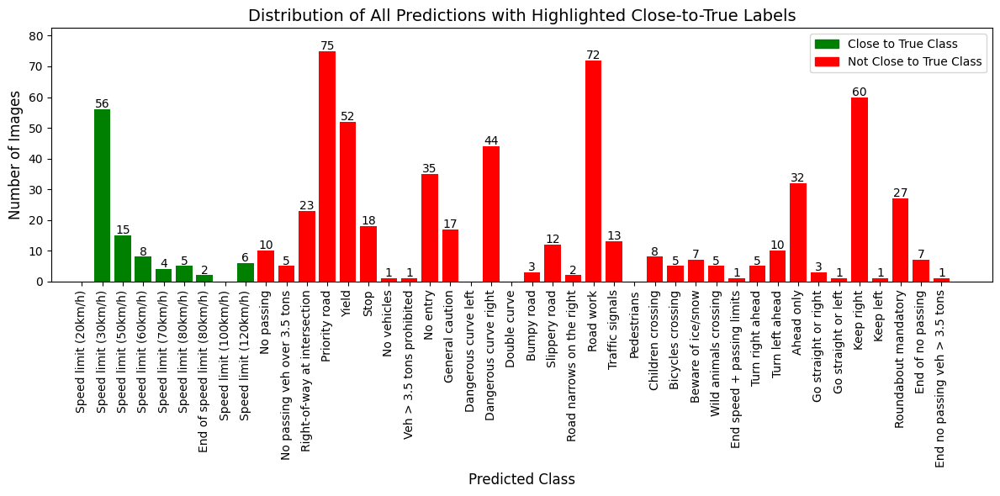

In [48]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches  # For custom legend handles

# Count all predictions
all_predictions_counts = predictions_df['Predicted Class'].value_counts()

# Identify the close-to-true labels
close_to_true_SL_labels = [0, 1, 2, 3, 4, 5, 6, 7, 8]

# Prepare colors: green for "close to true labels", red for others
bar_colors = ['green' if cls in close_to_true_SL_labels else 'red' for cls in all_predictions_counts.index]

# Get all possible class indices
all_classes = np.arange(len(classes))

# Plot a bar graph for all predictions
plt.figure(figsize=(12, 6))
bars = plt.bar(all_predictions_counts.index, all_predictions_counts.values, color=bar_colors)

# Adjust the y-axis limit to prevent overlap
y_max = max(all_predictions_counts.values)  # Find the maximum value in the dataset
plt.ylim(0, y_max + (0.1 * y_max))  # Add 10% buffer space above the tallest bar

# Add numbers on top of each bar
for bar in bars:
    height = bar.get_height()
    if height > 0:  # Only label bars with non-zero height
        plt.text(
            bar.get_x() + bar.get_width() / 2,  # X position (center of the bar)
            height + 0.5,                      # Y position (just above the bar)
            f'{int(height)}',                  # Text label (convert to integer)
            ha='center',                       # Horizontal alignment
            fontsize=10                         # Font size for the label
        )

# Customize the plot
plt.title("Distribution of All Predictions with Highlighted Close-to-True Labels", fontsize=14)
plt.xlabel("Predicted Class", fontsize=12)
plt.ylabel("Number of Images", fontsize=12)

# Set x-axis ticks to include all classes
plt.xticks(ticks=all_classes, labels=[classes.get(c, 'Unknown') for c in all_classes], rotation=90)

# Create custom legend
close_to_true_patch = mpatches.Patch(color='green', label='Close to True Class')
not_close_patch = mpatches.Patch(color='red', label='Not Close to True Class')
plt.legend(handles=[close_to_true_patch, not_close_patch], loc='upper right')

plt.tight_layout()
plt.show()

In [49]:
# Count all predictions
all_predictions_counts = predictions_df['Predicted Class'].value_counts()

# Identify the close-to-true labels
close_to_true_labels = [0, 1, 2, 3, 4, 5, 6, 7, 8]

# Count the total for each category
close_to_true_count = all_predictions_counts[all_predictions_counts.index.isin(close_to_true_labels)].sum()
not_close_to_true_count = all_predictions_counts[~all_predictions_counts.index.isin(close_to_true_labels)].sum()

# Print the results
print(f"Total number of images classified as 'Close to True Class': {close_to_true_count}")
print(f"Total number of images classified as 'Not Close to True Class': {not_close_to_true_count}")

Total number of images classified as 'Close to True Class': 96
Total number of images classified as 'Not Close to True Class': 556
